# Project
The energy companies are always facing the challenge of producing more accurate load forecasts. Many
factors have been studied to perform short-term, mid-term, and long-term trends forecast. For example,
GDP could be useful to forecast long term electricity consumption trends while holiday schedule and weather
conditions have direct impact to short term forecast. In the past two years, city lockdown due to COVID’19
pandemics has significant impact to electricity consumption. The hourly electricity consumption records in
the Tokyo area from 2016 to current are available in [1].
This dataset includes three columns: date, hour, and amount, as shown in Figure 1. The electricity
consumption is measured is by Megawatt.

Date, Time, Amount(10MW)  
2019/01/01, 00:00, 3017  

In this test, we ask forecast for hourly electricity consumption on the following four dates:
- January 1, 2021 (new year holiday in Japan)
- February 1, 2021 (Monday)
- March 20, 2021 (Peak of Cherry Blossom in Tokyo)
- July 23, 2021 (Opening day of 2020 Olympic game in Tokyo)
- July 26, 2021 (Forth day of 2020 Olympic game in Tokyo)

Additional data should not be limited to the information mentioned above. Depending on your hypotheses
and special events, features used for the forecast are flexible and could vary greatly. Do not limit your
imagination. Reference [2] helps ease the difficulties of implementation for crawling services. Some data,
such as holiday schedule and weather data in Tokyo from 2016 to current has been downloaded and provided
in [3].

References
- [1] https://www.tepco.co.jp/en/forecast/html/download-e.html  
- [2] https://github.com/alexbui91/Air-Quality-Prediction-Datasets  
- [3] https://drive.google.com/drive/folders/1ogzS9LIPg5X2covvORmDiBnzupj7ZmhB?usp=sharing  




# 1. Introduction: Forecast
In this notebook, we will try to forecast electricity consumption with ridge regression, SARIMAX and XGBoost.

Import required modules.

In [1]:
# import required modules
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import sklearn

from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

from statsmodels.graphics import tsaplots
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm

import pmdarima as pm
import xgboost as xgb
import warnings

Define helper functions.

In [2]:
def train_test(data, test_size = 0.15, scale = False, cols_to_transform=None, include_test_scale=False):
    """
    
        Perform train-test split with respect to time series structure
        
        - df: dataframe with variables X_n to train on and the dependent output y which is the column 'SDGE' in this notebook
        - test_size: size of test set
        - scale: if True, then the columns in the -'cols_to_transform'- list will be scaled using StandardScaler
        - include_test_scale: If True, the StandardScaler fits the data on the training as well as the test set; if False, then
          the StandardScaler fits only on the training set.
        
    """
    df = data.copy()
    # get the index after which test set starts
    test_index = int(len(df)*(1-test_size))
    
    # StandardScaler fit on the entire dataset
    if scale and include_test_scale:
        scaler = StandardScaler()
        df[cols_to_transform] = scaler.fit_transform(df[cols_to_transform])
        
    X_train = df.drop('mW', axis = 1).iloc[:test_index]
    y_train = df.mW.iloc[:test_index]
    X_test = df.drop('mW', axis = 1).iloc[test_index:]
    y_test = df.mW.iloc[test_index:]
    
    # StandardScaler fit only on the training set
    if scale and not include_test_scale:
        scaler = StandardScaler()
        X_train[cols_to_transform] = scaler.fit_transform(X_train[cols_to_transform])
        X_test[cols_to_transform] = scaler.transform(X_test[cols_to_transform])
    
    return X_train, X_test, y_train, y_test

def error_metrics(y_pred, y_truth, model_name = None, test = True):
    """
    Printing error metrics like RMSE (root mean square error), R2 score, 
    MAE (mean absolute error), MAPE (mean absolute % error). 
    
    y_pred: predicted values of y using the model model_name
    y_truth: observed values of y
    model_name: name of the model used for predictions
    test: if validating on test set, True; otherwise False for training set validation
    
    The function will print the RMSE, R2, MAE and MAPE error metrics for the model_name and also store the results along with 
    model_name in the dictionary dict_error so that we can compare all the models at the end.
    """
    if isinstance(y_pred, np.ndarray):
        y_pred = y_pred
    else:
        y_pred = y_pred.to_numpy()
        
    if isinstance(y_truth, np.ndarray):
        y_truth = y_truth
    else:
        y_truth = y_truth.to_numpy()
        
    print('\nError metrics for model {}'.format(model_name))
    
    RMSE = np.sqrt(mean_squared_error(y_truth, y_pred))
    print("RMSE or Root mean squared error: %.2f" % RMSE)
    
    # Explained variance score: 1 is perfect prediction

    R2 = r2_score(y_truth, y_pred)
    print('Variance score: %.2f' % R2 )

    MAE = mean_absolute_error(y_truth, y_pred)
    print('Mean Absolute Error: %.2f' % MAE)

    MAPE = (np.mean(np.abs((y_truth - y_pred) / y_truth)) * 100)
    print('Mean Absolute Percentage Error: %.2f %%' % MAPE)
    
    # Appending the error values along with the model_name to the dict
    if test:
        train_test = 'test'
    else:
        train_test = 'train'
    
    name_error = ['model', 'train_test', 'RMSE', 'R2', 'MAE', 'MAPE']
    value_error = [model_name, train_test, RMSE, R2, MAE, MAPE]
    list_error = list(zip(name_error, value_error))

def plot_ts_pred(og_ts, pred_ts, model_name=None, og_ts_opacity = 0.5, pred_ts_opacity = 0.5):
    """
    Plot plotly time series of the original (og_ts) and predicted (pred_ts) time series values to check how our model performs.
    model_name: name of the model used for predictions
    og_ts_opacity: opacity of the original time series
    pred_ts_opacity: opacity of the predicted time series
    """
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = og_ts.index, y = np.array(og_ts.values), name = "Observed",
                         line_color = 'deepskyblue', opacity = og_ts_opacity))

    try:
        fig.add_trace(go.Scatter(x = pred_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))
    except: #if predicted values are a numpy array they won't have an index
        fig.add_trace(go.Scatter(x = og_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))


    #fig.add_trace(go)
    fig.update_layout(title_text = 'Observed test set vs predicted energy mWH with {}'.format(model_name),
                  xaxis_rangeslider_visible = True)
    fig.show()

# 2. Load Data
Load data preprocessed in EDA.ipynb.

In [3]:
ec_df = pd.read_csv('./data/electricity_data.csv', index_col=0)
ec_df.index = pd.to_datetime(ec_df.index)
ec_df

,mW,year,month,day,hour,weekday,season,holiday,non_working,temp(F),...,dew_point(F),wind_speed(mph),wind_dir(deg),wind_dir(dir),uv_index,precip(inch),precip_hourly(inch),pressure(inch),humidity(%),overall
Dates,,,,,,,,,,,,,,,,,,,,,
2016-04-01 00:00:00,2555,2016,4,1,0,Friday,spring,0,working,57.0,...,52.0,3.0,130,SE,0.0,0.0,0.0,30.00,82.0,Mostly Cloudy
2016-04-01 01:00:00,2433,2016,4,1,1,Friday,spring,0,working,57.0,...,54.0,5.0,70,ENE,0.0,0.0,0.0,30.00,88.0,Mostly Cloudy
2016-04-01 02:00:00,2393,2016,4,1,2,Friday,spring,0,working,55.0,...,50.0,5.0,30,NNE,0.0,0.0,0.0,30.00,82.0,Mostly Cloudy
2016-04-01 03:00:00,2375,2016,4,1,3,Friday,spring,0,working,55.0,...,50.0,3.0,350,N,0.0,0.0,0.0,30.00,82.0,Partly Cloudy
2016-04-01 04:00:00,2390,2016,4,1,4,Friday,spring,0,working,57.0,...,48.0,7.0,350,N,0.0,0.0,0.0,30.00,72.0,Fair
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-31 19:00:00,3970,2021,8,31,19,Tuesday,summer,0,working,82.0,...,70.0,9.0,120,ESE,0.0,0.0,0.0,29.89,66.0,Showers in the Vicinity
2021-08-31 20:00:00,3672,2021,8,31,20,Tuesday,summer,0,working,82.0,...,68.0,10.0,70,ENE,0.0,0.0,0.0,29.92,62.0,Light Rain
2021-08-31 21:00:00,3396,2021,8,31,21,Tuesday,summer,0,working,75.0,...,72.0,18.0,30,NNE,0.0,0.0,0.0,29.92,89.0,Light Rain


We only use temp and humidity, since most weather info is related to season and temperature. Humidity is related to air conditioning, so is included.

In [4]:
ec_slr = ec_df[['mW', 'year', 'month', 'day', 'hour', 'weekday', 'season', 'holiday', 'non_working', 'temp(F)',  'humidity(%)']]

In [5]:
ec_slr.head()

,mW,year,month,day,hour,weekday,season,holiday,non_working,temp(F),humidity(%)
Dates,,,,,,,,,,,
2016-04-01 00:00:00,2555,2016,4,1,0,Friday,spring,0,working,57.0,82.0
2016-04-01 01:00:00,2433,2016,4,1,1,Friday,spring,0,working,57.0,88.0
2016-04-01 02:00:00,2393,2016,4,1,2,Friday,spring,0,working,55.0,82.0
2016-04-01 03:00:00,2375,2016,4,1,3,Friday,spring,0,working,55.0,82.0
2016-04-01 04:00:00,2390,2016,4,1,4,Friday,spring,0,working,57.0,72.0


# 3. Ridge regression
Let's try to fit data into ridge regression model.

## 3.1 Data preprocessing
Change categorical variables to one-hot encoding

In [6]:
# creating categorical columns for linear regression 
cat_cols = ['year', 'month', 'day', 'hour', 'weekday', 'season', 'holiday', 'non_working']

for col in cat_cols:
    ec_slr[col] = ec_slr[col].astype('category')

<ipython-input-6-5a5569cc7680>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ec_slr[col] = ec_slr[col].astype('category')


In [7]:
ec_slr.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 47375 entries, 2016-04-01 00:00:00 to 2021-08-31 23:00:00
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   mW           47375 non-null  int64   
 1   year         47375 non-null  category
 2   month        47375 non-null  category
 3   day          47375 non-null  category
 4   hour         47375 non-null  category
 5   weekday      47375 non-null  category
 6   season       47375 non-null  category
 7   holiday      47375 non-null  category
 8   non_working  47375 non-null  category
 9   temp(F)      47375 non-null  float64 
 10  humidity(%)  47375 non-null  float64 
dtypes: category(8), float64(2), int64(1)
memory usage: 1.8 MB


In [8]:
# Preparing dummy columns for use in sklearn's linear regression 
ec_lin = pd.get_dummies(ec_slr, drop_first = True)

In [9]:
ec_lin.head()

,mW,temp(F),humidity(%),year_2017,year_2018,year_2019,year_2020,year_2021,month_2,month_3,...,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday,season_spring,season_summer,season_winter,holiday_1,non_working_working
Dates,,,,,,,,,,,,,,,,,,,,,
2016-04-01 00:00:00,2555,57.0,82.0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
2016-04-01 01:00:00,2433,57.0,88.0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
2016-04-01 02:00:00,2393,55.0,82.0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
2016-04-01 03:00:00,2375,55.0,82.0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
2016-04-01 04:00:00,2390,57.0,72.0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1


In [10]:
ec_lin.columns

Index(['mW', 'temp(F)', 'humidity(%)', 'year_2017', 'year_2018', 'year_2019',
       'year_2020', 'year_2021', 'month_2', 'month_3', 'month_4', 'month_5',
       'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11',
       'month_12', 'day_2', 'day_3', 'day_4', 'day_5', 'day_6', 'day_7',
       'day_8', 'day_9', 'day_10', 'day_11', 'day_12', 'day_13', 'day_14',
       'day_15', 'day_16', 'day_17', 'day_18', 'day_19', 'day_20', 'day_21',
       'day_22', 'day_23', 'day_24', 'day_25', 'day_26', 'day_27', 'day_28',
       'day_29', 'day_30', 'day_31', 'hour_1', 'hour_2', 'hour_3', 'hour_4',
       'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11',
       'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17',
       'hour_18', 'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23',
       'weekday_Monday', 'weekday_Saturday', 'weekday_Sunday',
       'weekday_Thursday', 'weekday_Tuesday', 'weekday_Wednesday',
       'season_spring', 'season_summ

## 3.2. Fit ridge regression

In [11]:
# Keeping only the necessary columns; day columns were removed because there is 0 to none monthly seasonality in the data    
ec_lin.drop(['weekday_Monday', 'weekday_Saturday', 'weekday_Sunday', 'weekday_Thursday',
              'weekday_Tuesday', 'weekday_Wednesday', 'holiday_1', 'day_2', 'day_3', 'day_4', 'day_5', 'day_6',
               'day_7', 'day_8', 'day_9', 'day_10', 'day_11', 'day_12', 'day_13',
               'day_14', 'day_15', 'day_16', 'day_17', 'day_18', 'day_19', 'day_20',
               'day_21', 'day_22', 'day_23', 'day_24', 'day_25', 'day_26', 'day_27',
               'day_28', 'day_29', 'day_30', 'day_31'], axis = 1, inplace = True)

In [12]:
# Creating the train and test data
cols_to_transform = ['temp(F)',  'humidity(%)'] # other columns are binary values
X_train, X_test, y_train, y_test = train_test(ec_lin, test_size = 0.15, scale = True, cols_to_transform=cols_to_transform)

In [13]:
ridge = Ridge(alpha = 0.2, normalize = True)

In [14]:
# Fit the regressor to the data
ridge.fit(X_train, y_train)

# Compute and print the coefficients
ridge_coef = ridge.coef_

Text(0.5, 0, 'Features')

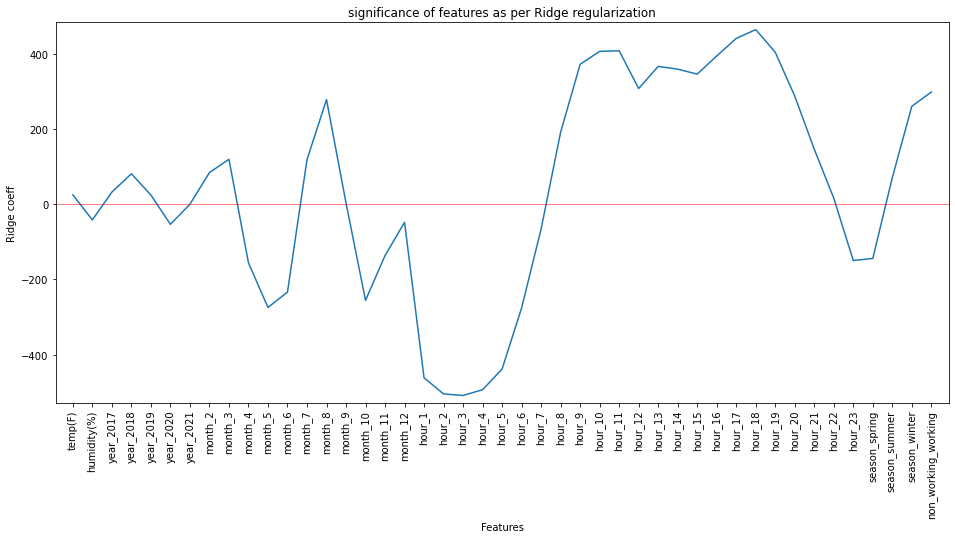

In [15]:
# Plot the coefficients
plt.figure(figsize = (16, 7))
plt.plot(range(len(X_train.columns)), ridge_coef)
plt.xticks(range(len(X_train.columns)), X_train.columns.values, rotation = 90)
plt.margins(0.02)
plt.axhline(0, linewidth = 0.5, color = 'r')
plt.title('significance of features as per Ridge regularization')
plt.ylabel('Ridge coeff')
plt.xlabel('Features')

## 3.3 Evaluate ridge regression

In [16]:
print('Ridge regression on training set')
error_metrics(ridge.predict(X_train), y_train, model_name = 'Ridge regression with scaling', test = False)

print('\nRidge regression on test set')
error_metrics(ridge.predict(X_test), y_test, model_name = 'Ridge regression with scaling', test = True)

Ridge regression on training set

Error metrics for model Ridge regression with scaling
RMSE or Root mean squared error: 363.64
Variance score: 0.69
Mean Absolute Error: 271.43
Mean Absolute Percentage Error: 8.36 %

Ridge regression on test set

Error metrics for model Ridge regression with scaling
RMSE or Root mean squared error: 382.67
Variance score: 0.69
Mean Absolute Error: 286.91
Mean Absolute Percentage Error: 8.75 %


In [17]:
# Plotting the observed test mWH and predicted mWH on the same graph as line plots
plot_ts_pred(y_test, ridge.predict(X_test), model_name='Ridge regression', og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

# Extra: Reduce feature space

In [18]:
# Creating a new dataframe similar to the first one
ec_df1 = pd.read_csv('./data/electricity_data.csv', index_col = 0)

In [19]:
ec_df1.head()

,mW,year,month,day,hour,weekday,season,holiday,non_working,temp(F),...,dew_point(F),wind_speed(mph),wind_dir(deg),wind_dir(dir),uv_index,precip(inch),precip_hourly(inch),pressure(inch),humidity(%),overall
Dates,,,,,,,,,,,,,,,,,,,,,
2016-04-01 00:00:00,2555,2016,4,1,0,Friday,spring,0,working,57.0,...,52.0,3.0,130,SE,0.0,0.0,0.0,30.0,82.0,Mostly Cloudy
2016-04-01 01:00:00,2433,2016,4,1,1,Friday,spring,0,working,57.0,...,54.0,5.0,70,ENE,0.0,0.0,0.0,30.0,88.0,Mostly Cloudy
2016-04-01 02:00:00,2393,2016,4,1,2,Friday,spring,0,working,55.0,...,50.0,5.0,30,NNE,0.0,0.0,0.0,30.0,82.0,Mostly Cloudy
2016-04-01 03:00:00,2375,2016,4,1,3,Friday,spring,0,working,55.0,...,50.0,3.0,350,N,0.0,0.0,0.0,30.0,82.0,Partly Cloudy
2016-04-01 04:00:00,2390,2016,4,1,4,Friday,spring,0,working,57.0,...,48.0,7.0,350,N,0.0,0.0,0.0,30.0,72.0,Fair


In [20]:
# Dividing the hours into 4 groups-> night, morning, afternoon, evening
hour_dict = {'morning': list(np.arange(7,13)),'afternoon': list(np.arange(13,16)), 'evening': list(np.arange(16,22)),
            'night': [22, 23, 0, 1, 2, 3, 4, 5, 6]}

In [21]:
def time_of_day(x):
    if x in hour_dict['morning']:
        return 'morning'
    elif x in hour_dict['afternoon']:
        return 'afternoon'
    elif x in hour_dict['evening']:
        return 'evening'
    else:
        return 'night'

In [22]:
ec_df1['time_of_day'] = ec_df1['hour'].apply(time_of_day)

In [23]:
ec_df.head()

,mW,year,month,day,hour,weekday,season,holiday,non_working,temp(F),...,dew_point(F),wind_speed(mph),wind_dir(deg),wind_dir(dir),uv_index,precip(inch),precip_hourly(inch),pressure(inch),humidity(%),overall
Dates,,,,,,,,,,,,,,,,,,,,,
2016-04-01 00:00:00,2555,2016,4,1,0,Friday,spring,0,working,57.0,...,52.0,3.0,130,SE,0.0,0.0,0.0,30.0,82.0,Mostly Cloudy
2016-04-01 01:00:00,2433,2016,4,1,1,Friday,spring,0,working,57.0,...,54.0,5.0,70,ENE,0.0,0.0,0.0,30.0,88.0,Mostly Cloudy
2016-04-01 02:00:00,2393,2016,4,1,2,Friday,spring,0,working,55.0,...,50.0,5.0,30,NNE,0.0,0.0,0.0,30.0,82.0,Mostly Cloudy
2016-04-01 03:00:00,2375,2016,4,1,3,Friday,spring,0,working,55.0,...,50.0,3.0,350,N,0.0,0.0,0.0,30.0,82.0,Partly Cloudy
2016-04-01 04:00:00,2390,2016,4,1,4,Friday,spring,0,working,57.0,...,48.0,7.0,350,N,0.0,0.0,0.0,30.0,72.0,Fair


In [24]:
# creating categorical columns for linear regression 
cat_cols1 = ['month', 'day', 'hour', 'weekday', 'season', 'holiday', 'non_working', 'time_of_day']
# not including year above to capture the decreasing energy trend over increasing value of years
for col in cat_cols1:
    ec_df1[col] = ec_df1[col].astype('category')

In [25]:
# Columns to use for regression
cols_use = ['mW', 'year', 'time_of_day', 'season', 'non_working', 'temp(F)',  'humidity(%)']

In [26]:
ec1_lin = pd.get_dummies(ec_df1[cols_use], drop_first = True)

In [27]:
ec1_lin.head()

,mW,year,temp(F),humidity(%),time_of_day_evening,time_of_day_morning,time_of_day_night,season_spring,season_summer,season_winter,non_working_working
Dates,,,,,,,,,,,
2016-04-01 00:00:00,2555,2016,57.0,82.0,0,0,1,1,0,0,1
2016-04-01 01:00:00,2433,2016,57.0,88.0,0,0,1,1,0,0,1
2016-04-01 02:00:00,2393,2016,55.0,82.0,0,0,1,1,0,0,1
2016-04-01 03:00:00,2375,2016,55.0,82.0,0,0,1,1,0,0,1
2016-04-01 04:00:00,2390,2016,57.0,72.0,0,0,1,1,0,0,1


In [28]:
cols_to_transform = ['temp(F)',  'humidity(%)', 'year']
X_train, X_test, y_train, y_test = train_test(ec1_lin, test_size = 0.15, scale = True, cols_to_transform=cols_to_transform, 
                                              include_test_scale=False)

# Extra: Add lags as X variables

What makes the time series different from other datasets is that the current y value depends on the previous N values in time depending on the correlation of the data with its lagged version. For example, today's outside temperature can depend on yesterday's outside temperature or maybe depend on the last 5 days of temperature values. The energy consumption values can also be expected to depend on it's previous lagged values because energy consumption of a region shouldn't be expected to change much except for any unexpected or unfortunate events. So we will add the lagged values of energy consumtpion as the X parameters and check if we can predict better using the past values.

In [29]:
for i in range(24):
    ec1_lin['lag'+str(i+1)] = ec1_lin['mW'].shift(i+1)

In [30]:
lag_ec = ec1_lin.dropna()

In [31]:
lag_ec.head(2)

,mW,year,temp(F),humidity(%),time_of_day_evening,time_of_day_morning,time_of_day_night,season_spring,season_summer,season_winter,...,lag15,lag16,lag17,lag18,lag19,lag20,lag21,lag22,lag23,lag24
Dates,,,,,,,,,,,,,,,,,,,,,
2016-04-02 00:00:00,2613,2016,48.0,87.0,0,0,1,1,0,0,...,3159.0,2965.0,2775.0,2631.0,2467.0,2390.0,2375.0,2393.0,2433.0,2555.0
2016-04-02 01:00:00,2492,2016,48.0,87.0,0,0,1,1,0,0,...,3211.0,3159.0,2965.0,2775.0,2631.0,2467.0,2390.0,2375.0,2393.0,2433.0


In [32]:
cols_to_transform = ['temp(F)',  'humidity(%)', 'year']
# Adding the energy consumption lags to the columns to transform 
list_lags = ['lag'+str(i+1) for i in range(24)]
cols_to_transform.extend(list_lags)

X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test(lag_ec,
                                                              test_size = 0.15, scale = True,
                                                              cols_to_transform=cols_to_transform)

# 4. SARIMAX
Next, we will try to forecast electricity consumption with SARIMAX.

## 4.1. Data preprocessing

In [33]:
ec_df = pd.read_csv('./data/electricity_data.csv', index_col=0)

Get consumption column only to get simple time series.

In [34]:
ec_ts = pd.DataFrame(ec_df['mW'], columns=['mW'])

In [35]:
ec_ts

,mW
Dates,
2016-04-01 00:00:00,2555
2016-04-01 01:00:00,2433
2016-04-01 02:00:00,2393
2016-04-01 03:00:00,2375
2016-04-01 04:00:00,2390
...,...
2021-08-31 19:00:00,3970
2021-08-31 20:00:00,3672
2021-08-31 21:00:00,3396


In [36]:
def plot_timeseries(ts, title = 'og', opacity = 1):
    """
    Plot plotly time series of any given timeseries ts
    """
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = ts.index, y = ts.values, name = "observed",
                         line_color = 'lightslategrey', opacity = opacity))

    fig.update_layout(title_text = title,
                  xaxis_rangeslider_visible = True)
    fig.show()

In [37]:
ec_ts.head()

,mW
Dates,
2016-04-01 00:00:00,2555
2016-04-01 01:00:00,2433
2016-04-01 02:00:00,2393
2016-04-01 03:00:00,2375
2016-04-01 04:00:00,2390


In [38]:
plot_timeseries(ec_ts['mW'], title = 'Original data set')

## 4.2. Stationarity
ARIMA models need stationarity assumption to work. Let's check this with ADF test.

In [39]:
def run_adfuller(ts):
    result = adfuller(ts)
    # Print test statistic
    print("t-stat", result[0])
    # Print p-value
    print("p-value", result[1])
    # Print #lags used
    print("#lags used", result[2])
    # Print critical values
    print("critical values", result[4]) 

In [40]:
print("for no differencing\n")
run_adfuller(ec_ts['mW'])
print("\nfor single differencing\n")
run_adfuller(ec_ts['mW'].diff().dropna())
print("\nfor differenced data set over lags 24 after single differencing\n")
run_adfuller(ec_ts['mW'].diff().dropna().diff(24).dropna())

for no differencing

t-stat -12.595007126334712
p-value 1.7867694366353765e-23
#lags used 56
critical values {'1%': -3.4304882064919098, '5%': -2.86160108435474, '10%': -2.5668025131950696}

for single differencing

t-stat -36.44043154539096
p-value 0.0
#lags used 56
critical values {'1%': -3.430488209412932, '5%': -2.86160108564574, '10%': -2.5668025138822315}

for differenced data set over lags 24 after single differencing

t-stat -46.99716053981891
p-value 0.0
#lags used 56
critical values {'1%': -3.4304882795545164, '5%': -2.861601116646119, '10%': -2.566802530382841}


p-values state stationarity, but with differencing, it gets more significant. 

## 4.3. ACF, PACF Plots
We can view patterns with these plots.

In [41]:
def acf_pacf_plots(ts, lags, figsize = (12,8)):
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize = figsize)
    
    # Plot the ACF of ts
    _ = plot_acf(ts, lags = lags, zero = False, ax = ax1, alpha = 0.05)

    # Plot the PACF of ts
    _ = plot_pacf(ts, lags = lags, zero = False, ax = ax2, alpha = 0.05)

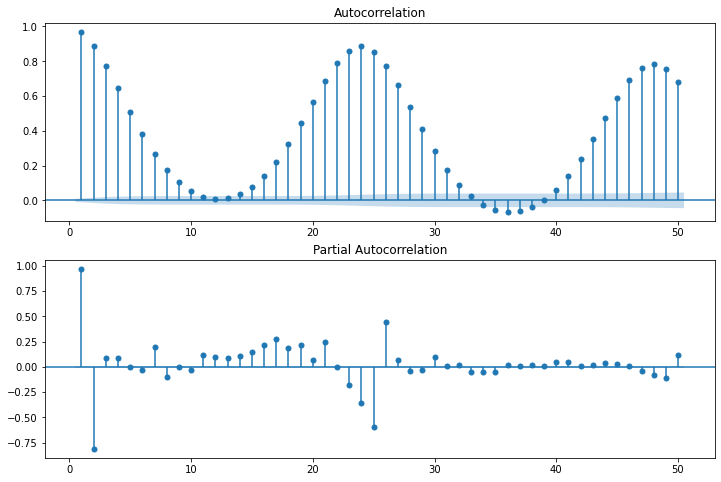

In [42]:
# Create the acf and pacf plots

dfacf = []
dfacf = ec_ts['mW']
lags = 50

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

Seasonal period of 24hours are observed!

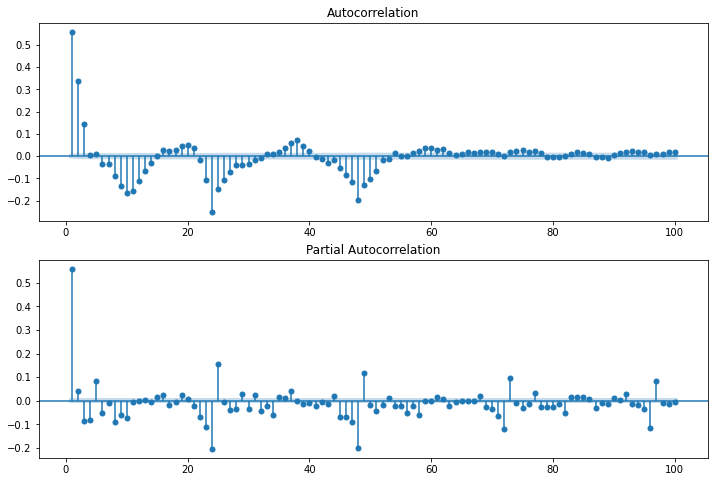

In [43]:
# Differencing the data this time to remove the trend and seasonality
dfacf = []
dfacf = ec_ts['mW']
dfacf = dfacf.diff().dropna() 
dfacf = dfacf.diff(24).dropna()
dfacf = dfacf.diff(24*365).dropna()
lags = 100

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

After differencing, its hard to say which AR, MA are good, and this is a problem. They can't handle multiple seasonality.

## 4.4. Fourier
Let's use fourier series to add columns on cycle positions, to account for multiple seasonality.

In [44]:
lag_ec.index = pd.to_datetime(lag_ec.index)

In [45]:
warnings.filterwarnings('ignore')

# We can add multiple fourer series with different k terms in the (2*k*pi) such as k=1,2,3...etc.
def add_fourier_terms(df, year_k, week_k, day_k):
    """
    df: dataframe to add the fourier terms to 
    year_k: the number of Fourier terms the year period should have. Thus the model will be fit on 2*year_k terms (1 term for 
    sine and 1 for cosine)
    week_k: same as year_k but for weekly periods
    day_k:same as year_k but for daily periods
    """
    
    for k in range(1, year_k+1):
        # year has a period of 365.25 including the leap year
        df['year_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.dayofyear/365.25) 
        df['year_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.dayofyear/365.25)

    for k in range(1, week_k+1):
        
        # week has a period of 7
        df['week_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.dayofweek/7)
        df['week_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.dayofweek/7)


    for k in range(1, day_k+1):
        
        # day has period of 24
        df['hour_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.hour/24)
        df['hour_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.hour/24) 

In [46]:
warnings.filterwarnings('ignore')

add_fourier_terms(lag_ec, year_k= 5, week_k=5 , day_k=5)

In [47]:
lag_ec[['hour_sin1', 'hour_cos1']]

,hour_sin1,hour_cos1
Dates,,
2016-04-02 00:00:00,0.000000,1.000000
2016-04-02 01:00:00,0.258819,0.965926
2016-04-02 02:00:00,0.500000,0.866025
2016-04-02 03:00:00,0.707107,0.707107
2016-04-02 04:00:00,0.866025,0.500000
...,...,...
2021-08-31 19:00:00,-0.965926,0.258819
2021-08-31 20:00:00,-0.866025,0.500000
2021-08-31 21:00:00,-0.707107,0.707107


<AxesSubplot:xlabel='Dates'>

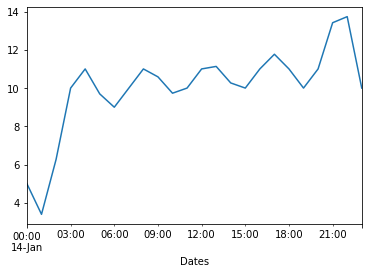

In [48]:
pd.plotting.register_matplotlib_converters()
(1-lag_ec.loc['2020/01/14':'2020/01/14', [col for col in lag_ec if col.startswith('hour')]]).sum(axis = 1).plot()

<AxesSubplot:xlabel='Dates'>

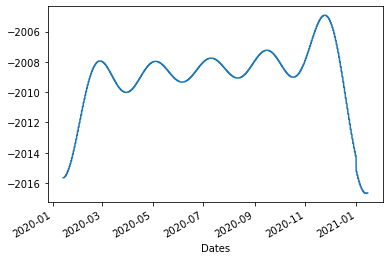

In [49]:
# Visualizing the new variables on year seasonality
(1-lag_ec.loc['2020/01/14':'2021/01/14', [col for col in lag_ec if col.startswith('year')]]).sum(axis = 1).plot()

<AxesSubplot:xlabel='Dates'>

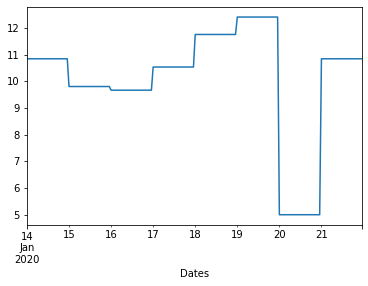

In [50]:
# Visualizing the new variables on week seasonality
(1-lag_ec.loc['2020/01/14':'2020/01/21', [col for col in lag_ec if col.startswith('week')]]).sum(axis = 1).plot()

In [51]:
lag_ec.columns

Index(['mW', 'year', 'temp(F)', 'humidity(%)', 'time_of_day_evening',
       'time_of_day_morning', 'time_of_day_night', 'season_spring',
       'season_summer', 'season_winter', 'non_working_working', 'lag1', 'lag2',
       'lag3', 'lag4', 'lag5', 'lag6', 'lag7', 'lag8', 'lag9', 'lag10',
       'lag11', 'lag12', 'lag13', 'lag14', 'lag15', 'lag16', 'lag17', 'lag18',
       'lag19', 'lag20', 'lag21', 'lag22', 'lag23', 'lag24', 'year_sin1',
       'year_cos1', 'year_sin2', 'year_cos2', 'year_sin3', 'year_cos3',
       'year_sin4', 'year_cos4', 'year_sin5', 'year_cos5', 'week_sin1',
       'week_cos1', 'week_sin2', 'week_cos2', 'week_sin3', 'week_cos3',
       'week_sin4', 'week_cos4', 'week_sin5', 'week_cos5', 'hour_sin1',
       'hour_cos1', 'hour_sin2', 'hour_cos2', 'hour_sin3', 'hour_cos3',
       'hour_sin4', 'hour_cos4', 'hour_sin5', 'hour_cos5'],
      dtype='object')

In [52]:
# Choosing a subset of the above dataframe; removing the lags and the hour bins
ec_cyc = lag_ec.drop([col for col in lag_ec if 
                         col.startswith('time') or col.startswith('season') or col.startswith('lag')], axis=1)

## 4.5. Fit SARIMAX model

In [53]:
ec_cyc.columns

Index(['mW', 'year', 'temp(F)', 'humidity(%)', 'non_working_working',
       'year_sin1', 'year_cos1', 'year_sin2', 'year_cos2', 'year_sin3',
       'year_cos3', 'year_sin4', 'year_cos4', 'year_sin5', 'year_cos5',
       'week_sin1', 'week_cos1', 'week_sin2', 'week_cos2', 'week_sin3',
       'week_cos3', 'week_sin4', 'week_cos4', 'week_sin5', 'week_cos5',
       'hour_sin1', 'hour_cos1', 'hour_sin2', 'hour_cos2', 'hour_sin3',
       'hour_cos3', 'hour_sin4', 'hour_cos4', 'hour_sin5', 'hour_cos5'],
      dtype='object')

In [54]:
# Creating the training and test datasets

# not adding year variable here because the model will use the most recent lag energy consumption values
cols_to_transform = ['temp(F)',  'humidity(%)']  
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test(ec_cyc, 
                                                              test_size = 0.15, scale = True, 
                                                              cols_to_transform=cols_to_transform)

# Since ARIMA model uses the past lag y values, scaling the energy values as well. 
scaler1 = StandardScaler()
y_train_lag = pd.DataFrame(scaler1.fit_transform(y_train_lag.values.reshape(-1,1)), index = y_train_lag.index, 
                           columns = ['mW'])

Find the best parameters

In [ ]:
results = pm.auto_arima(y_train_lag, #data
                    d=1, # non-seasonal difference order
                    start_p=1, # initial guess for p
                    start_q=1, # initial guess for q
                    max_p=2, # max value of p to test
                    max_q=2, # max value of q to test
                    exogenous= X_train_lag, #including the exogenous variables
                    seasonal=True, # is the time series seasonal? YES
                    m = 24, # the seasonal period
                    #D=1, # seasonal difference order
                    start_P=1, # initial guess for P
                    start_Q=1, # initial guess for Q
                    max_P=1, # max value of P to test
                    max_Q=1, # max value of Q to test
                    information_criterion='aic', # used to select best model
                    trace=True, # print results whilst training
                    error_action='ignore', # ignore orders that don't work
                    stepwise=True, # apply intelligent order search
                    )

Performing stepwise search to minimize aic


In [84]:
# Use optimal SARIMAX order from above
model_opt = SARIMAX(y_train_lag, order=(2,1,1), seasonal_order=(1, 0, 1, 24), exog = X_train_lag, trend='c')

In [85]:
results = model_opt.fit()

In [86]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                 mW   No. Observations:                40248
Model:             SARIMAX(2, 1, 1)x(1, 0, 1, 24)   Log Likelihood               48138.882
Date:                            Sun, 26 Sep 2021   AIC                         -96195.764
Time:                                    22:43:37   BIC                         -95843.049
Sample:                                         0   HQIC                        -96084.152
                                          - 40248                                         
Covariance Type:                              opg                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
intercept           -7.851e-05      0.000     -0.270      0.787      -0.001       0.000
year                    0.0264      0.039      0.684      0.494      -0.049       0.102
temp(F)                 0.0226      0.003      7.223      0.000       0.016       0.029
humidity(%)             0.0041      0.001      3.710      0.000       0.002       0.006
non_working_working     0.0034      0.011      0.314      0.754      -0.018       0.025
year_sin1              -0.7565      0.684     -1.107      0.269      -2.096       0.583
year_cos1              -0.6702      0.879     -0.762      0.446      -2.393       1.053
year_sin2              -0.8916      0.480     -1.856      0.063      -1.833       0.050
year_cos2               1.5861      0.397      3.998      0.000       0.808       2.364
year_sin3              -0.1223      0.298     -0.410      0.682      -0.707       0.462
year_cos3              -0.3004      0.331     -0.908      0.364      -0.949       0.348
year_sin4               0.0709      0.238      0.298      0.766      -0.396       0.538
year_cos4               0.0191      0.221      0.087      0.931      -0.413       0.451
year_sin5               0.0412      0.173      0.238      0.812      -0.297       0.380
year_cos5               0.0156      0.160      0.097      0.923      -0.298       0.329
week_sin1               0.0031      0.007      0.418      0.676      -0.011       0.018
week_cos1               0.0170      0.006      2.812      0.005       0.005       0.029
week_sin2              -0.0027      0.001     -1.829      0.067      -0.006       0.000
week_cos2               0.0020      0.002      0.950      0.342      -0.002       0.006
week_sin3              -0.0055      0.001     -4.860      0.000      -0.008      -0.003
week_cos3               0.0009      0.001      0.878      0.380      -0.001       0.003
week_sin4              -0.0056      0.001     -4.870      0.000      -0.008      -0.003
week_cos4               0.0009      0.001      0.878      0.380      -0.001       0.003
week_sin5              -0.0032      0.001     -2.163      0.031      -0.006      -0.000
week_cos5               0.0020      0.002      0.950      0.342      -0.002       0.006
hour_sin1              -0.3589      0.011    -34.002      0.000      -0.380      -0.338
hour_cos1              -1.0024      0.006   -160.808      0.000      -1.015      -0.990
hour_sin2              -0.2847      0.005    -52.393      0.000      -0.295      -0.274
hour_cos2              -0.0062      0.005     -1.120      0.263      -0.017       0.005
hour_sin3               0.0858      0.003     26.490      0.000       0.079       0.092
hour_cos3               0.0357      0.003     11.465      0.000       0.030       0.042
hour_sin4              -0.0035      0.002     -1.409      0.159      -0.008       0.001
hour_cos4              -0.0436      0.002    -21.399 

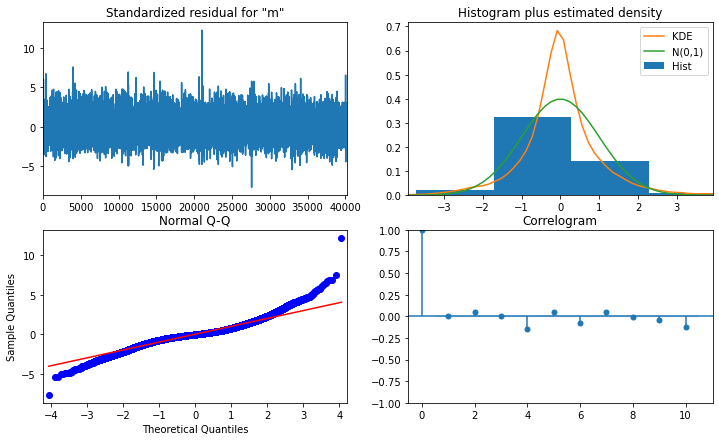

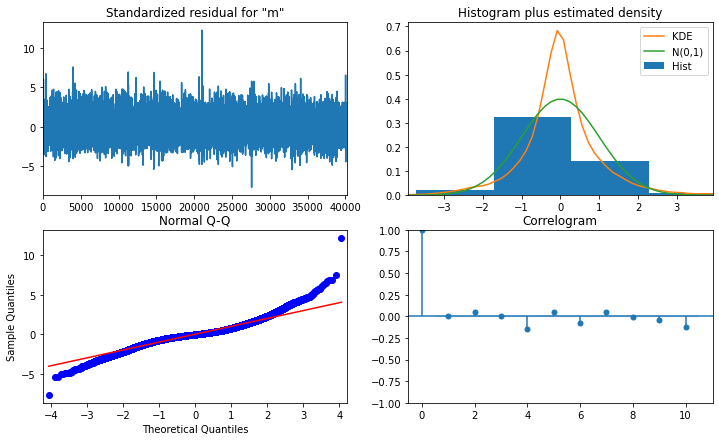

In [87]:
results.plot_diagnostics(figsize=(12, 7))

In [88]:
# Predictions on train set. Predicting only the last week of the training set
pred = results.get_prediction(start=X_train_lag.index[-24*7], end=X_train_lag.index[-1], 
                              dynamic=True, exog=X_train_lag.iloc[-24*7:, :])
pred_ci = pred.conf_int()

pred1 = scaler1.inverse_transform(pred.predicted_mean)
pred_ci1 = scaler1.inverse_transform(pred.conf_int())

y_actual_train = np.squeeze(scaler1.inverse_transform(y_train_lag))
y_actual_train = pd.Series(y_actual_train, index = X_train_lag.index )

pred1 = pd.Series(pred1, index = X_train_lag.iloc[-24*7:, :].index )
pred_ci1 = pd.DataFrame(pred_ci1, index = pred1.index, columns = ['lower mW', 'upper mW'])

lower_limits = pred_ci1.loc[:,'lower mW']
upper_limits = pred_ci1.loc[:,'upper mW']

In [89]:
# Error on training set for 1 week ahead forecast
error_metrics(pred1, y_actual_train.iloc[-24*7:], 'SARIMAX(2,1,1)x(1,0,1,24) with Fourier terms 1 week', 
              test=False) 


Error metrics for model SARIMAX(2,1,1)x(1,0,1,24) with Fourier terms 1 week
RMSE or Root mean squared error: 488.84
Variance score: -0.65
Mean Absolute Error: 446.20
Mean Absolute Percentage Error: 15.29 %


Text(0.5, 1.0, 'Testing the SARIMAX (2,1,1)x(1,0,1,24) model on the training set: predicting the last week')

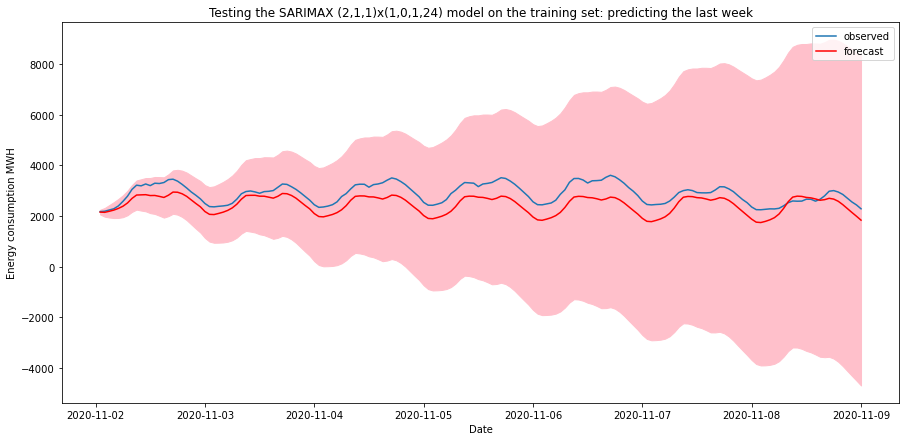

In [90]:
# plot the predictions
plt.figure(figsize = (15,7))
plt.plot(y_actual_train.iloc[-24*7:].index, y_actual_train.iloc[-24*7:], label='observed')

# plot your mean predictions
plt.plot(pred1.index, pred1.values, color='r', label='forecast')

# shade the area between your confidence limits
plt.fill_between(lower_limits.index, lower_limits, upper_limits, color='pink')

# set labels, legends and show plot
plt.xlabel('Date')
plt.ylabel('Energy consumption MWH')
plt.legend()
plt.title('Testing the SARIMAX (2,1,1)x(1,0,1,24) model on the training set: predicting the last week')

Text(0.5, 1.0, 'Testing the SARIMAX (2,1,1)x(1,0,1,24) model on the testing set: predicting the 1st week')

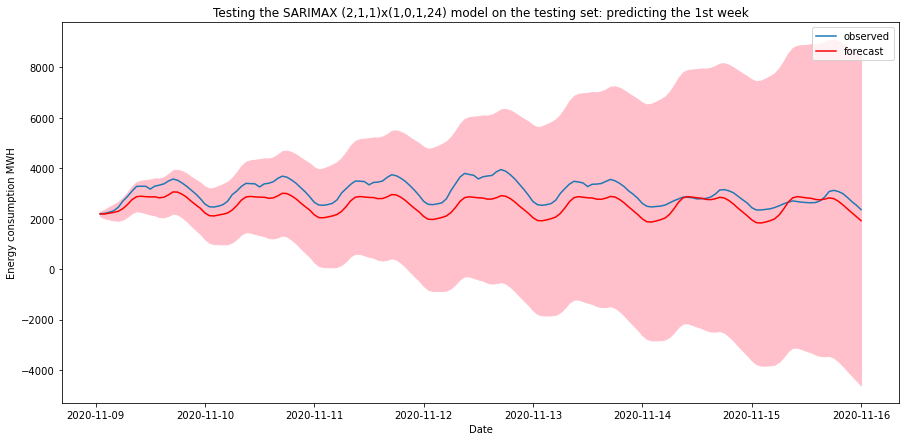

In [91]:
# Predictions on test set. Predicting only the 1st week of the test set
pred = results.get_forecast(steps = 24*7, exog = X_test_lag.iloc[:24*7, :])
pred_ci = pred.conf_int()

pred2 = scaler1.inverse_transform(pred.predicted_mean)
pred_ci2 = scaler1.inverse_transform(pred.conf_int())

y_actual = y_test_lag.iloc[:24*7]

pred2 = pd.Series(pred2, index = X_test_lag.iloc[:24*7, :].index )
pred_ci2 = pd.DataFrame(pred_ci2, index = pred2.index, columns = ['lower SDGE', 'upper SDGE'])

lower_limits = pred_ci2.loc[:,'lower SDGE']
upper_limits = pred_ci2.loc[:,'upper SDGE']

# plot the predictions
plt.figure(figsize = (15,7))
plt.plot(y_actual.index, y_actual, label='observed')

# plot your mean predictions
plt.plot(pred2.index, pred2.values, color='r', label='forecast')

# shade the area between your confidence limits
plt.fill_between(lower_limits.index, lower_limits, upper_limits, color='pink')

# set labels, legends and show plot
plt.xlabel('Date')
plt.ylabel('Energy consumption MWH')
plt.legend()
plt.title('Testing the SARIMAX (2,1,1)x(1,0,1,24) model on the testing set: predicting the 1st week')

In [92]:
error_metrics(pred2, y_actual, 'SARIMAX(2,1,1)x(1,0,1,24) with Fourier terms 1 week', test=True) 


Error metrics for model SARIMAX(2,1,1)x(1,0,1,24) with Fourier terms 1 week
RMSE or Root mean squared error: 566.58
Variance score: -0.72
Mean Absolute Error: 515.61
Mean Absolute Percentage Error: 16.71 %


We see that the forecasting performance decreases and the confidence interval values grow larger beyond the scale of the range of the energy consumption values. Thus, SARIMAX model was not able to capture long term trends but it did okay on 1 week ahead forecast.
SARIMA models don't capture multiple seasonalities well and are also very time consuming. So, it won't be the first choice if we need both a quick and accurate forecast.

# 5. XGBoost

## 5.1 Prepare train, test set

In [55]:
cols_to_transform = ['temp(F)',  'humidity(%)', 'year']  
X_trainF, X_testF, y_trainF, y_testF = train_test(ec_cyc, 
                                                              test_size = 0.15, scale = True, 
                                                              cols_to_transform=cols_to_transform)

## 5.2 Fit XGBoost model

In [56]:
# convert the dataset into an optimized data structure called Dmatrix that XGBoost supports
data_dmatrix = xgb.DMatrix(data = ec_cyc.drop('mW', axis=1), label = ec_cyc['mW'])

In [57]:
# generating the model
xg_reg = xgb.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 3, alpha = 5, n_estimators = 100, random_state=42)

In [58]:
# Fitting the model on the training set
xg_reg.fit(X_trainF, y_trainF)

[09:51:35] WARNING: ../src/objective/regression_obj.cu:171: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(alpha=5, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.3, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=3,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1,
             objective='reg:linear', random_state=42, reg_alpha=5, reg_lambda=1,
             scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [59]:
# Predicting on test set
preds_boost = xg_reg.predict(X_testF)

## 5.3 Measure XGBoost performance

In [60]:
error_metrics(preds_boost, y_testF, model_name='XGBoost with Fourier terms', test=True)


Error metrics for model XGBoost with Fourier terms
RMSE or Root mean squared error: 198.54
Variance score: 0.92
Mean Absolute Error: 145.81
Mean Absolute Percentage Error: 4.30 %


In [61]:
error_metrics(xg_reg.predict(X_trainF), y_trainF, model_name='XGBoost with Fourier terms', test= False)


Error metrics for model XGBoost with Fourier terms
RMSE or Root mean squared error: 164.95
Variance score: 0.94
Mean Absolute Error: 123.36
Mean Absolute Percentage Error: 3.76 %


## 5.4 Plot predictions

In [62]:
plot_ts_pred(y_trainF, xg_reg.predict(X_trainF), model_name='XGBoost with Fourier terms on Training set')

In [63]:
plot_ts_pred(y_testF, preds_boost, model_name='XGBoost with Fourier terms on Test set')

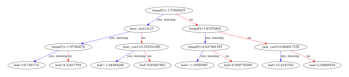

In [64]:
xgb.plot_tree(xg_reg,num_trees=98) # Choosing the last few trees because the model optimizes sequentially
plt.rcParams['figure.figsize'] = [300, 400]

# 6. Prediction

In [65]:
dates_to_predict = ['2021/01/01', '2021/02/01', '2021/03/20', '2021/07/23', '2021/07/26']

In [66]:
xgb_result = pd.DataFrame(data=preds_boost, index=y_testF.index, columns=['prediction'])
xgb_result['observed'] = y_testF

In [67]:
for date in dates_to_predict:
    print(xgb_result[date])

                      prediction  observed
Dates                                     
2021-01-01 00:00:00  2618.759033      3184
2021-01-01 01:00:00  2534.230225      2978
2021-01-01 02:00:00  2439.082275      2834
2021-01-01 03:00:00  2417.979004      2743
2021-01-01 04:00:00  2481.613770      2697
2021-01-01 05:00:00  2505.164307      2729
2021-01-01 06:00:00  2767.648926      2869
2021-01-01 07:00:00  3042.336914      3090
2021-01-01 08:00:00  3269.230957      3221
2021-01-01 09:00:00  3318.975586      3151
2021-01-01 10:00:00  3175.445801      3030
2021-01-01 11:00:00  3148.909912      2919
2021-01-01 12:00:00  3018.400391      2811
2021-01-01 13:00:00  2933.820557      2738
2021-01-01 14:00:00  2934.325684      2710
2021-01-01 15:00:00  3041.867676      2783
2021-01-01 16:00:00  3107.275635      2979
2021-01-01 17:00:00  3170.323242      3304
2021-01-01 18:00:00  3244.062012      3399
2021-01-01 19:00:00  3279.838623      3413
2021-01-01 20:00:00  3247.886963      3401
2021-01-01 

# 7. Conclusion
### Contribution
- Found XGBoost model that is great in performance
    - Fast training, low test error, deals with multiple seasonality
    - Comparison of linear regression, traditional time series, and ensemble model

### Limitation
- Due to short timeline, could not experiment with additional features.

### Future work
- Explore various additional features (Sports event, COVID, etc.)
- Use prediction model for upcoming dates
- Practical usage: ex) plan energy generation for a city

